In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling
#!pip install pandas_profiling
from datetime import datetime

pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.10}'.format
pd.set_option('display.precision', 4)
pd.set_option('mode.chained_assignment',  None)

## 데이터 확인하기

In [2]:
df = pd.read_csv('MADUP_DS_dataset.csv',skiprows=[0], engine='python')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9526 entries, 0 to 9525
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   campagin_id             9526 non-null   int64  
 1   objective               9526 non-null   object 
 2   bid_strategy            9526 non-null   object 
 3   bid_amount              46 non-null     float64
 4   buying_type             9526 non-null   object 
 5   adset_id                9526 non-null   int64  
 6   ad_start_time           9526 non-null   object 
 7   daily budget            1865 non-null   object 
 8   lifetime_budget         7769 non-null   object 
 9   optimization_goal       9526 non-null   object 
 10  custom_event_type       1574 non-null   object 
 11  age_max                 9526 non-null   int64  
 12  age_min                 9526 non-null   int64  
 13  device_platforms        9339 non-null   object 
 14  publisher_platforms     9339 non-null   

## pandas profiling으로 상관관계 파악하기 

- 최소 17살, 30 ~ 55세에서 구매가 자주 일어나는 것으로 확인 (interactions)
- row(purchase), col(age_max or age_min)


In [3]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 데이터 마이닝

- ## 특이값 
#### - daily budget -> #VALUE!
- df[(df['daily budget'].notna()) & (df['lifetime_budget'].notna())]에서 발견  값이 없다고 가정하고 진행   

#### - targeting_optimization -> 'none'   
- 타겟팅 옵션 유무로 표현 (0, 1)

In [4]:
class Data_preprocess():
    def __init__(self, df):
        self.df = df
        self.data = self.process(self.df)
    
    # 날짜형 변환
    def change_datetime_type(self, df, title):
        df[title] = pd.to_datetime(df[title], infer_datetime_format=True)
        return df

    #타겟팅 옵션 유무로 표현 (0, 1)
    def target_1_or_0(self,df, title):
            target = df[title].fillna(0)
            df[title] = pd.Series([1 if i != 0 else 0 for i in target])
            return df

    def ad_during(self, df):
            if df < 50:
                df = '50_under'
            elif 50 < df <= 100:
                df = '50~100'
            elif 100 < df <=150:
                df = '100~150'
            elif 150 < df <= 200:
                df = '150~200'
            else:
                df = '200_up'
            return df
        
    def process(self, df):
        # 날짜 변환
        df = self.change_datetime_type(df, 'date')
        df = self.change_datetime_type(df, 'ad_start_time')

        
        # 클릭당 매출이 얼만큼 발생하는지
        df['click_per_purchase_value'] = (df['purchase_value'] / df['link_click']).round(2)
        
        # 특이값 수정
        df['daily budget'] = df['daily budget'].fillna(0).replace('#VALUE!', 0)
        df['lifetime_budget'] = df['lifetime_budget'].str.strip('""').fillna(0).astype('int32')
        df['spend'] = df['spend'].astype('int32')
        
        df['targeting_optimization'].fillna('none', inplace=True)
        df['targeting_optimization'] = df['targeting_optimization'].str.strip('""')
        
        # 타겟 설정 binary로 표현 - 결측치가 더 많기에 타겟 유무로 판단
        df = self.target_1_or_0(df, 'lookalike target')
        df = self.target_1_or_0(df, 'family_status')

        ## 광고 기간 구하기
        df['ad_during'] = df['date'] - df['ad_start_time']
        df['ad_during'] = df['ad_during'].apply(lambda x: x.days if x.days > 0 else 0)
        df['ad_durings'] = df['ad_during'].apply(self.ad_during)

        #### - 관심사 키워드 유무를 1, 0 인 binary로 표현
        df['interests_use_or_not'] = df['interests'].apply(lambda x: 0 if pd.isnull(x) else 1)

        # 광고가 어떤 플랫폼을 사용하는지 알아야 유의미한 값을 도출할 수 있기에 제외
        df = df[pd.notnull(df['device_platforms'])].reset_index()
        df['device_platform'] = df['device_platforms'].apply(lambda x: x.replace('[', '').replace(']', ''))

        # 클릭 수는 0인데 매출은 있는 경우 14개 제외
        df = df[(df['link_click'] > 0) & (df['purchase_value'] > 0)]

        df.reset_index(drop=True, inplace=True)
        df.drop(columns='index', inplace=True)

        df['platforms'] = df['publisher_platforms'].apply(lambda x: x.replace('[', '').replace(']', ''))
        
        # 클릭당 비용 cost per click
        df['cpc'] = (df['spend'] / df['link_click']).round(2)
        # 전환율 conversion Rate
        df['cvr'] = (df['view_content'] / df['link_click'] * 100).round(2)
        
        # 광고 첫 시행 후 결과 도출 한 월 차이 구하기
        df['month_passed'] = ((df['date'].dt.year - df['ad_start_time'].dt.year) * 12 + (df['date'].dt.month - df['ad_start_time'].dt.month))
        
        return df

In [5]:
data = Data_preprocess(df)
df = data.data

# 관심사 키워드를 사용하면 많은 판매가 일어나는지 시각화

interests_use_or_not
0    65737491504
1    30575932936
Name: purchase_value, dtype: int64


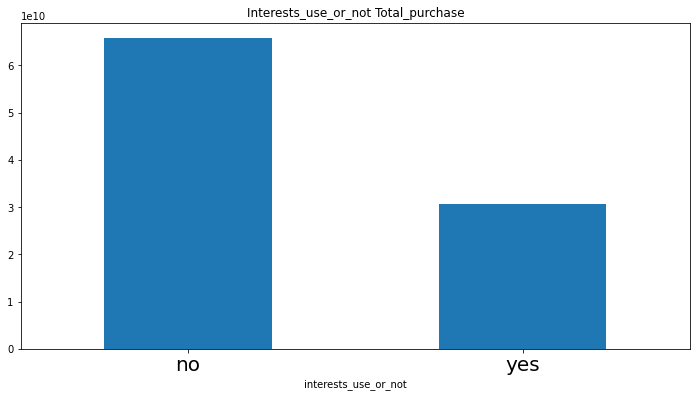

In [6]:
# 총 합계
df.groupby('interests_use_or_not')['purchase_value'].agg(sum).plot(kind='bar', figsize=(12, 6)); 
plt.title('Interests_use_or_not Total_purchase')
plt.xticks([0, 1], ['no', 'yes'], rotation=0, size=20);
print(df.groupby('interests_use_or_not')['purchase_value'].agg(sum))

interests_use_or_not
0   20314428.77
1   5234708.601
Name: purchase_value, dtype: float64


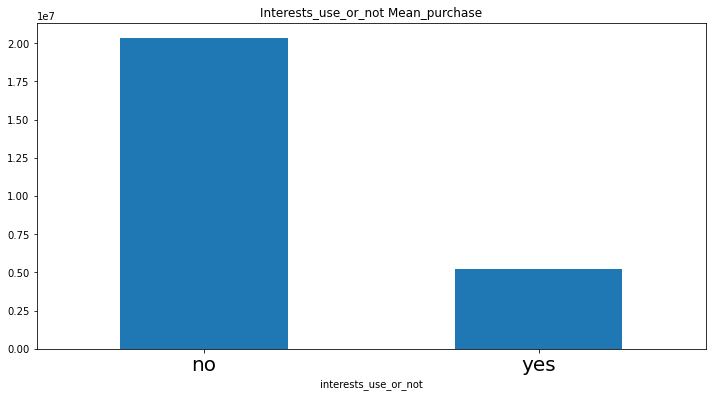

In [7]:
# 평균 합계
df.groupby('interests_use_or_not')['purchase_value'].agg('mean').plot(kind='bar',figsize=(12, 6));
plt.title('Interests_use_or_not Mean_purchase')
plt.xticks([0, 1], ['no', 'yes'], rotation=0, size=20);
print(df.groupby('interests_use_or_not')['purchase_value'].agg('mean'))

# 키워드 유무 별 link_click, view_content 평균값 비교 

                      link_click  view_content
interests_use_or_not                          
0                    1279.153276   941.5701483
1                    588.2152029   385.5834617


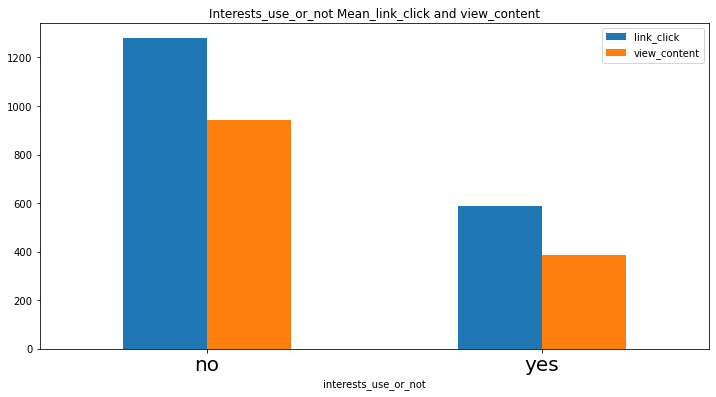

In [8]:
df.groupby('interests_use_or_not')[['link_click', 'view_content']].agg('mean').plot(kind='bar',figsize=(12, 6));
plt.title('Interests_use_or_not Mean_link_click and view_content')
plt.xticks([0, 1], ['no', 'yes'], rotation=0, size=20);
print(df.groupby('interests_use_or_not')[['link_click', 'view_content']].agg('mean'))

interests_use_or_not
0    357
1    822
dtype: int64


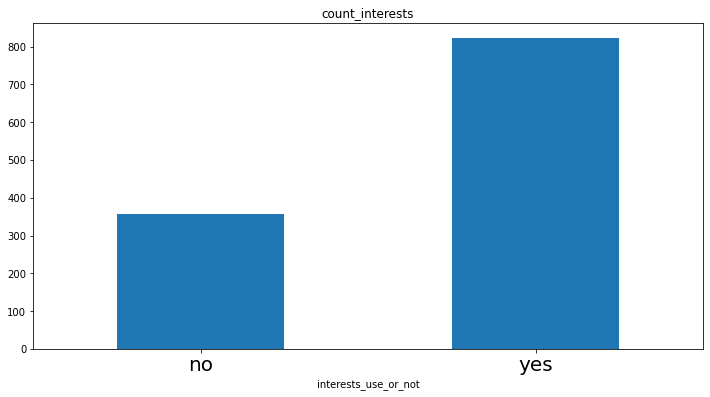

In [9]:
# 혹시나 키워드 설정 한 경우가 적지 않을까에 해답 
# 키워드를 설정한 경우가 약 2배 가량 많은 상황
# 키워드가 없는 경우가 더 많은 매출 및 link_click, view_content 발생

count_keywords = df.pivot_table(index='adset_id', columns='interests_use_or_not', values='purchase', aggfunc='count').fillna(0).reset_index(drop=True)
count_keywords[0] = [1 if i > 0 else 0 for i in count_keywords[0]]
count_keywords[1] = [1 if i > 0 else 0 for i in count_keywords[1]]
count_keywords.sum().plot(kind='bar', figsize=(12, 6))
plt.xticks([0, 1], ['no', 'yes'], rotation=0, size=20)
plt.title('count_interests');
print(count_keywords.sum())

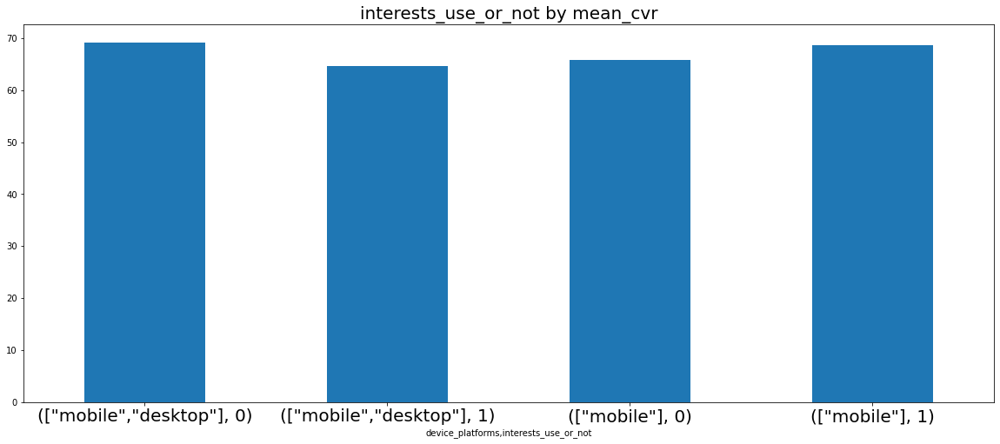

In [10]:
# 플랫폼, 키워드 유무별 평균 전환율 시각화 
df.groupby([ 'device_platforms','interests_use_or_not'])['cvr'].mean().plot(kind='bar', figsize=(20, 8))
plt.title('interests_use_or_not by mean_cvr', size=20)
plt.xticks(rotation=0, size=20);

In [11]:
df.groupby(['interests_use_or_not', 'device_platforms'])['cvr'].mean()

interests_use_or_not  device_platforms    
0                     ["mobile","desktop"]   69.18978936
                      ["mobile"]             65.83750943
1                     ["mobile","desktop"]   64.66797516
                      ["mobile"]             68.66556718
Name: cvr, dtype: float64

# Device_platforms 별로 판매량 비교하기
- nan값이 187개 존재 - 제외
- device platform 별 시각화

In [12]:
print(df['device_platforms'].unique())
print(df['device_platforms'].isna().sum())

['["mobile"]' '["mobile","desktop"]']
0


device_platform
"mobile"              16235098910
"mobile","desktop"    80078325530
Name: purchase_value, dtype: int64


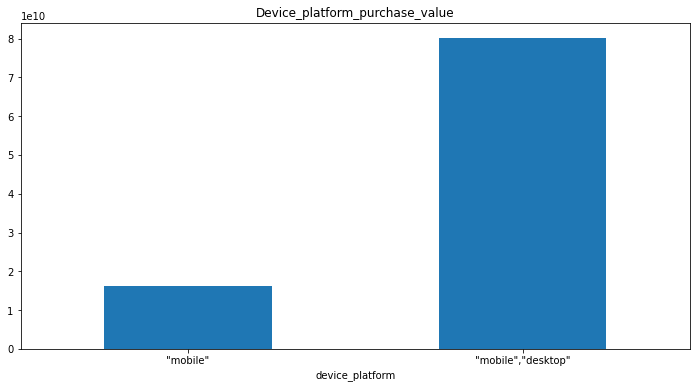

In [13]:
# 총 매출에서는 많은 차이가 발생 
df.groupby('device_platform')['purchase_value'].sum().plot(kind='bar',figsize=(12, 6));
plt.xticks(rotation=0)
plt.title('Device_platform_purchase_value');
print(df.groupby('device_platform')['purchase_value'].sum())

device_platform
"mobile"             6920332.016
"mobile","desktop"   11896943.33
Name: purchase_value, dtype: float64


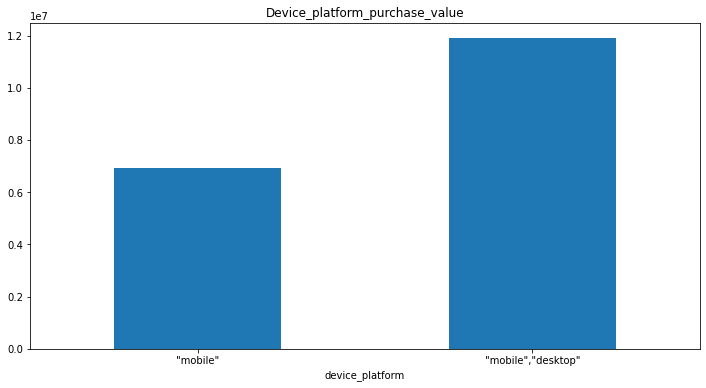

In [14]:
# 평균적인 매출을 보게 되면 mobile, desktop 에서 많은 소비가 이루어진다라 보여집니다.
# desktop에서 많은 매출이 발생하지만 모바일과 합쳐져 있기에 모바일이 많은 강세를 띈다라고 보여집니다.

df.groupby(['device_platform'])['purchase_value'].mean().plot(kind='bar',figsize=(12, 6));
plt.xticks(rotation=0)
plt.title('Device_platform_purchase_value');
print(df.groupby('device_platform')['purchase_value'].mean())

# 클릭 수에 매출은 비례한가 확인
- 클릭 수는 0인데 매출은 있는 경우 14개 
- 14개 제외하고 시각화

objective
REACH                   237203.85
BRAND_AWARENESS         208722.77
VIDEO_VIEWS              25682.91
PRODUCT_CATALOG_SALES    21228.32
CONVERSIONS              18963.75
LINK_CLICKS               8101.52
dtype: float64


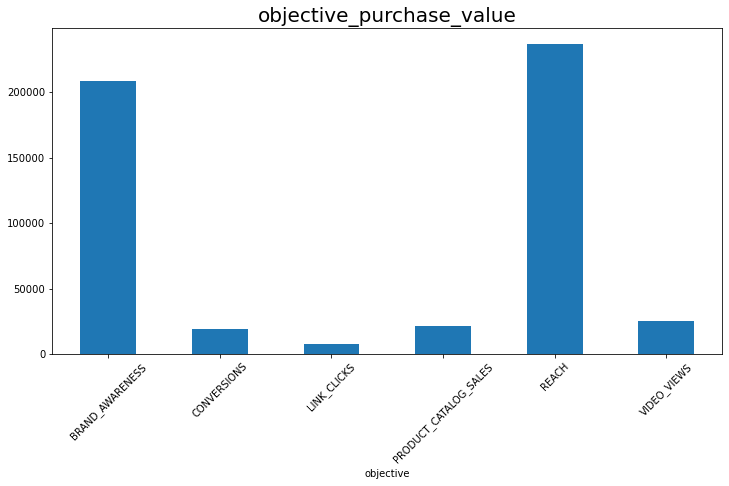

In [15]:
# 광고 캠페인의 목표를 기준으로 Reach, Brand_AWARENESS 에서 클릭 대비 많은 이익 발생

(df.groupby(['objective']).sum()['purchase_value'] / df.groupby(['objective']).sum()['link_click']).plot(kind='bar',figsize=(12, 6))
plt.xticks(rotation=45);
plt.title('objective_purchase_value', size=20)
print((df.groupby(['objective']).sum()['purchase_value'] / df.groupby(['objective']).sum()['link_click']).round(2).sort_values(ascending=False))

objective
REACH                   3.72
BRAND_AWARENESS         2.88
VIDEO_VIEWS             0.35
PRODUCT_CATALOG_SALES   0.28
CONVERSIONS             0.26
LINK_CLICKS             0.11
dtype: float64


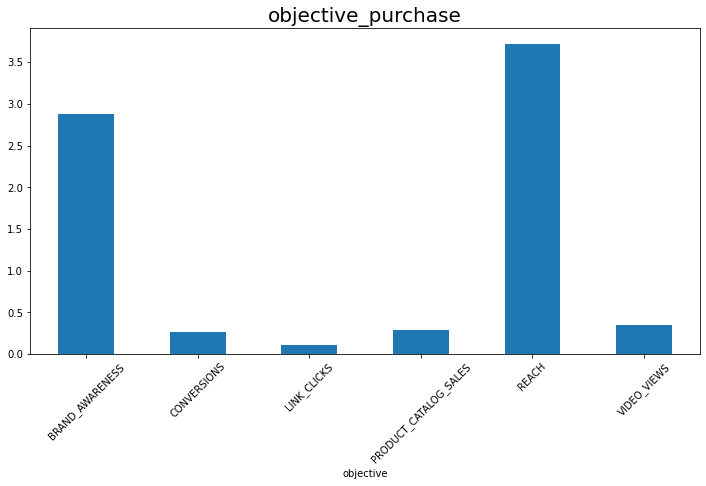

In [16]:
# 광고 캠페인의 목표를 기준으로 Reach, Brand_AWARENESS 에서 클릭 대비 많은 제품 판매 

(df.groupby(['objective']).sum()['purchase'] / df.groupby(['objective']).sum()['link_click']).plot(kind='bar',figsize=(12, 6))
plt.xticks(rotation=45)
plt.title('objective_purchase', size=20);
print((df.groupby(['objective']).sum()['purchase'] / df.groupby(['objective']).sum()['link_click']).round(2).sort_values(ascending=False))

# 매출 Top 10 시각화 진행

- 캠페인 매출액 Top_10
    - 어떤 캠페인에서 많은 판매가 이루어지는지 시각화 진행(campagin_id)   


- Top_10_campagin_id 중 많은 연관 검색어 시각화
    - 캠페인에서 연관검색어 중 많이 등장하는 단어를 시각화

In [17]:
# campain_id unique를 뽑은 후 캠페인 별 총합을 구해서 
# dictionary {key(campain_id) : values(sum(purchase_values))}로 적용
# 캠페인 별 매출 현황을 확인하기 위함

campagin_id_index = df['campagin_id'].unique()
campagin_frame = {}

for i in campagin_id_index:
    value = df.pivot_table(index=['campagin_id', 'adset_id'])['purchase_value'].loc[i].sum()
    campagin_frame[i] = (value / len(df[df['campagin_id'] == i])).round(1)

              sum_purchase
campagin_id               
673269945700    12452796.6
935611595700     9960275.5
574077605700     9488154.0
655387285700     8806998.6
533232595500     6885064.8
477433075700     6379699.2
816026855700     6005786.8
245637345700     5833420.5
709385545500     5299480.9
596981765500     4588450.9


/Users/chiyeong/miniforge3/envs/tf/lib/python3.8/site-packages/matplotlib/text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


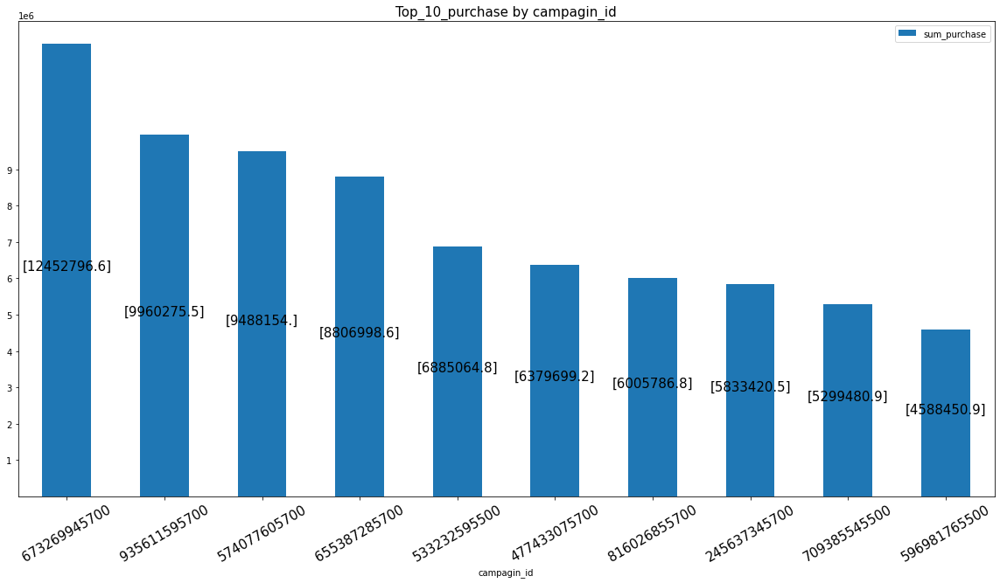

In [18]:
# Top_10 캠페인 아이디 별 시각화  
print(pd.Series(campagin_frame).reset_index().rename(columns={'index': 'campagin_id',0 : 'sum_purchase'}).sort_values(ascending=False,
                                                                                                                      by='sum_purchase')[:10].set_index('campagin_id'))

campagin = pd.Series(campagin_frame).reset_index().rename(columns={'index': 'campagin_id',
                                                                   0 : 'sum_purchase'}).sort_values(ascending=False,
                                                                                                    by='sum_purchase')[:10].set_index('campagin_id')
campagin.plot(kind='bar',
              figsize=(20,10))

#plt annotate 진행
def add_value_label(x_list,y_list):
    for i in range(1, len(x_list)+1):
        plt.annotate(y_list[i-1],(i-1,y_list[i-1]/2),ha="center", size=15)

plt.xticks(rotation='30', fontsize=15);
plt.yticks(np.arange(1000000, 10000000, 1000000))
plt.title('Top_10_purchase by campagin_id', size=15)
add_value_label(campagin.index, campagin.values)
plt.show();

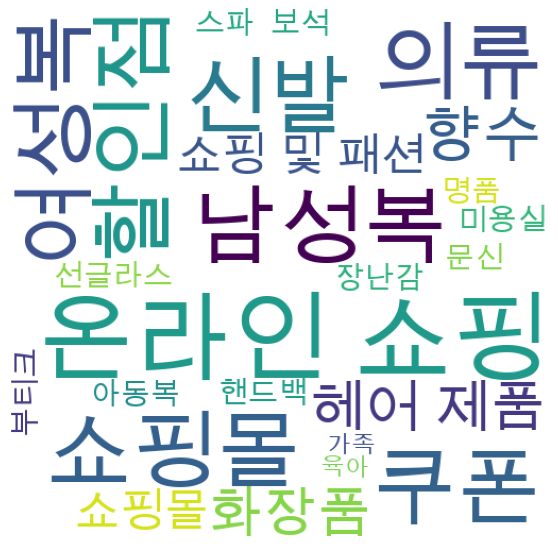

In [19]:
# Top_10 별 많은 매출을 낸 캠페인에서 어떤 관심사 키워드를 선정을 했는지 시각화 진행 

top_10_purchase = pd.Series(campagin_frame).reset_index().rename(columns={'index': 'campagin_id',
                                                                          0 : 'sum_purchase'}).sort_values(ascending=False,
                                                                                                           by='sum_purchase')[:10].set_index('campagin_id')
# WordCloud 진행
# 온라인과 쇼핑, 쇼핑몰, 쿠폰, 할인점, 의류 라는 키워드가 많은 등장으로 text_size가 크게 출력
# 많은 의류 쇼핑을 위주로 많은 키워드를 작성한 것으로 보입니다.

from wordcloud import WordCloud
from collections import Counter

def word_cloud(data):
    data_list = []
    for i in data.index:
        words = df[df['campagin_id'] == i]['interests']
        for j in words:
            if pd.notna(j):
                data_list.extend(j.split(','))

    count = Counter(data_list)
    most_count = count.most_common(100)

    window_font = 'C://Windows//Font//NanumGothic.ttf'
    mac_font = '/Fonts/Arial Unicode.ttf'

    wc = WordCloud(font_path=mac_font,
              background_color = 'white',
              width=512,
              height=512,
              max_font_size=500,
              max_words=1000)
    plt.figure(figsize=(25, 10))
    plt.imshow(wc.generate_from_frequencies(dict(most_count)))
    plt.axis('off');
    
word_cloud(top_10_purchase)

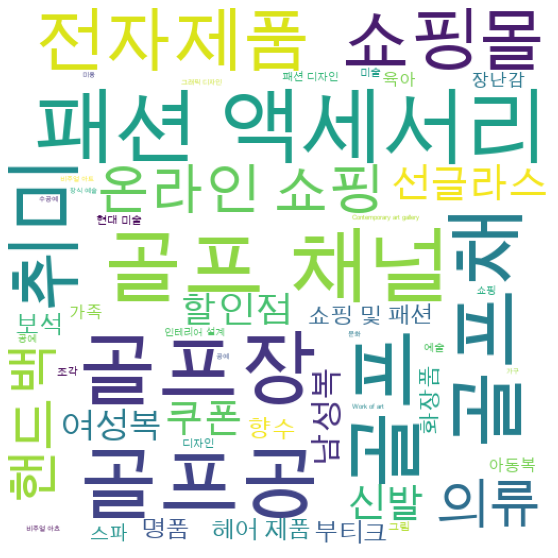

In [20]:
# 낮은 매출을 보이는 top-10 광고 키워드 시각화
last_10_purchase = pd.Series(campagin_frame).reset_index().rename(columns={'index': 'campagin_id',
                                                                          0 : 'sum_purchase'}).sort_values(ascending=False,
                                                                                                           by='sum_purchase')[-10:].set_index('campagin_id')
    
word_cloud(last_10_purchase)

# 높은 전환율을 보이는 키워드 시각화

In [21]:
# 높은 전환율을 보이는 키워드 시각화 
campagin_cvr = {}

for i in campagin_id_index:
    value = df.pivot_table(index=['campagin_id', 'adset_id'])['cvr'].loc[i].sum()
    campagin_frame[i] = (value / len(df[df['campagin_id'] == i])).round(1)
    
campaign_mean_cvr = pd.Series(campagin_frame).reset_index().rename(columns={'index': 'campagin_id',0 : 'mean_cvr'}).sort_values(ascending=False,
                                                                                                                      by='mean_cvr').set_index('campagin_id')
campagin_mean_cvr = campaign_mean_cvr[(campaign_mean_cvr['mean_cvr'] < 100) & (campaign_mean_cvr['mean_cvr'] > 0)]

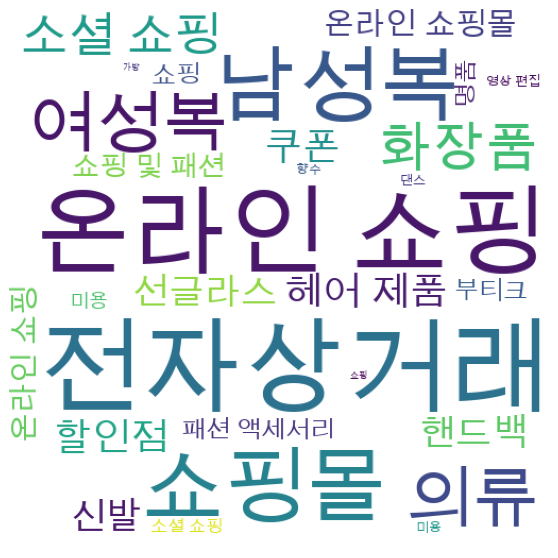

In [22]:
word_cloud(campagin_mean_cvr[:10])

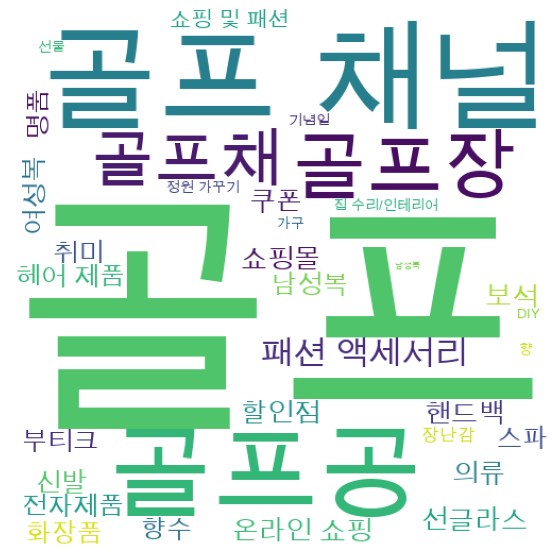

In [23]:
# 낮은 전환율을 보이는 키워드 
word_cloud(campagin_mean_cvr[-10:])

# 목표설정 별 순 판매액 확인
- 목표설정에 따른 매출액 / 목표설정 개수 
- 단순 클릭이 아닌 목표설정에 따른 매출 비교하기 위함

In [24]:
# 1 - objective 별 총 판매액 / objective 개수 
# 2 - objective 별 총 소비액 / objective 개수 
# pd.cocnat(1, 2, axis=1)
# 1(평균판매액) - 2(평균 소비액) = pure_purchase_value 

objective = (df.groupby(['objective'])[['purchase_value', 'spend']].sum()['purchase_value'] / df['objective'].value_counts()).sort_values(ascending=False).reset_index().set_index('index').rename(columns={0 : 'objective_purchase_value'})

objective_spend = pd.concat([objective,pd.DataFrame(df.groupby(['objective'])[['purchase_value',
                                                                               'spend']].sum()['spend'] / df['objective'].value_counts().sort_values(ascending=False))], axis=1)
objective_spend.rename(columns={0 : 'objective_spend'}, inplace=True)

# 가장 많은 목표설정은 link_clicks
df['objective'].value_counts().reset_index().set_index('index').style.highlight_max(axis=0, props='color:red; font-weight:bold',)

,objective
index,
LINK_CLICKS,5773
CONVERSIONS,2302
PRODUCT_CATALOG_SALES,918
VIDEO_VIEWS,71
BRAND_AWARENESS,11
REACH,2


BRAND_AWARENESS         50235473.55
PRODUCT_CATALOG_SALES   38560439.57
REACH                    18616327.5
CONVERSIONS             8916710.687
LINK_CLICKS              6451981.34
VIDEO_VIEWS             3281185.423
dtype: float64


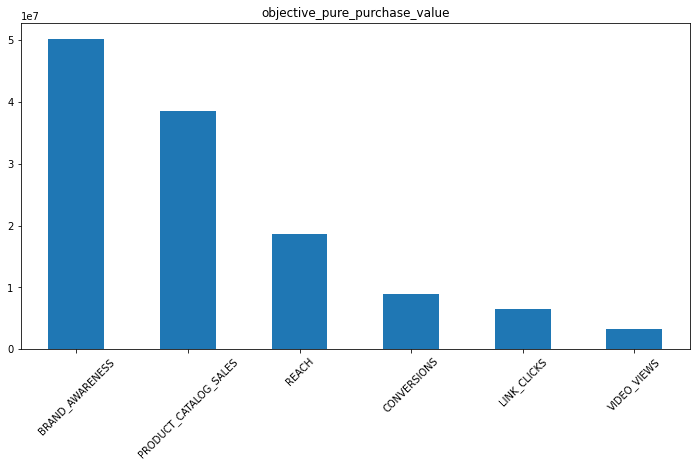

In [25]:
# 현재 link_click를 중점으로 많은 광고가 진행되는 것으로 확인 
# 브랜드 인지 및 제품 카탈로그의 판매목적이 많은 매출을 달성한다는게 보여집니다.

print(objective_spend['objective_purchase_value'] - objective_spend['objective_spend'])
(objective_spend['objective_purchase_value'] - objective_spend['objective_spend']).plot(kind='bar' ,figsize=(12, 6))
plt.xticks(rotation=45)
plt.title('objective_pure_purchase_value');

# 광고 기간은 언제까지가 적당할까 시각화

- 가설 
    - 광고기간이 길어질 수록 전환율은 늘어날까 
    - 광고기간이 짧아지면 전환율은 줄어드는 걸까

In [26]:
df.ad_durings.value_counts()

50_under    8483
50~100       221
100~150      193
200_up       153
150~200       27
Name: ad_durings, dtype: int64

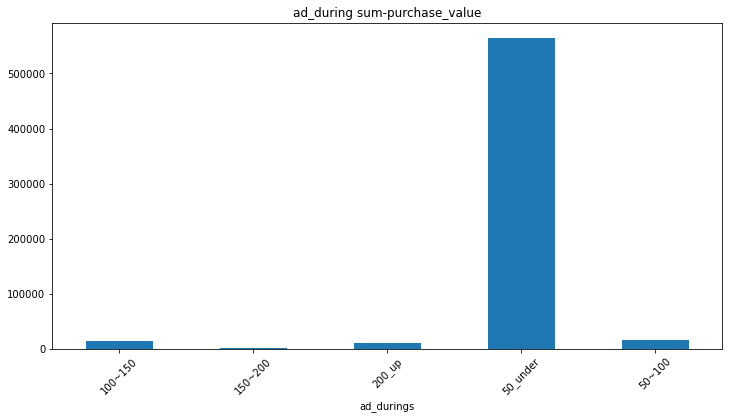

In [27]:
# 광고 기간 별 전환율 비교 
# 총 매출액에서는 광고 50일 미만이 많은 매출 발생
# 이유는 많은 광고가 적용했기 때문

df.groupby('ad_durings')['cvr'].sum().plot(kind='bar',figsize=(12, 6))
plt.xticks(rotation=45)
plt.title('ad_during sum-purchase_value');
#print(df.groupby('ad_durings').sum()['purchase_value'])

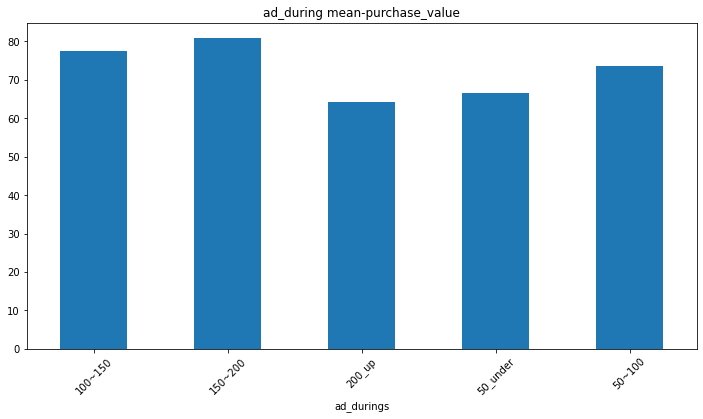

In [28]:
# 광고기간별 전환율을 시각화

df.groupby('ad_durings')['cvr'].mean().plot(kind='bar',figsize=(12, 6))
plt.xticks(rotation=45)
plt.title('ad_during mean-purchase_value');

In [29]:
print('고유 캠페인 개수 :',len(df['campagin_id'].unique()))
print('고유 광고 아이디 개수 : ',len(df['adset_id'].unique()))

고유 캠페인 개수 : 92
고유 광고 아이디 개수 :  1101


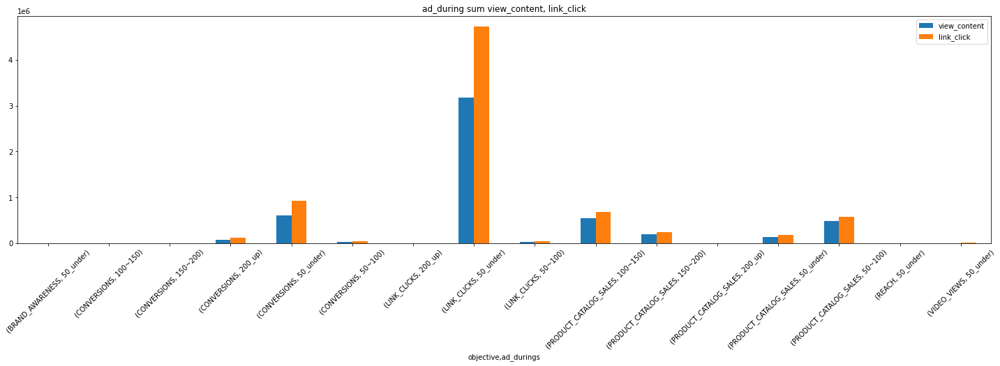

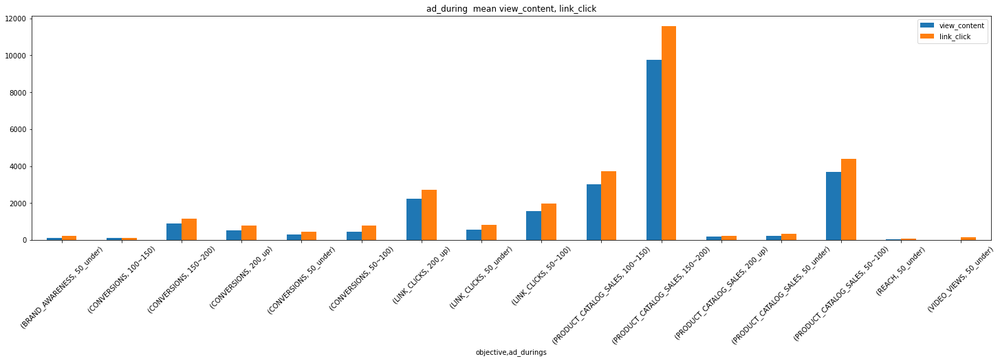

In [30]:
# 설정한 광고, 기간별 기준으로 view_content, link_click 값 확인
# PRODUCT_CATALOG_SALES 100~ 200일에 많은 view_content, link_click 발생

# 합계
df.groupby(['objective','ad_durings'])[['view_content', 'link_click']].sum().plot(kind='bar',figsize=(25, 6))
plt.xticks(rotation=45)
plt.title('ad_during sum view_content, link_click')

#print(df.groupby(['objective', 'ad_durings'])[['view_content', 'link_click']].mean())
# 평균
df.groupby(['objective','ad_durings'])[['view_content', 'link_click']].mean().plot(kind='bar',figsize=(25, 6))
plt.xticks(rotation=45);
plt.title('ad_during  mean view_content, link_click');

# 총합으로 설정한 광고목표인 link_clicks는 광고기간 50_under에 많은 view_content, link_click 발생 
# 설정한 광고목표들이 값이 다르기에 평균값으로 적용
# 평균으로 설정한 광고목표인 products_catalog_sales는 광고기간 100~ 200에 많은 view_content, link_click

## 광고로 사용하는 플랫폼에서 기간별 클릭 수 비교하기 

- mobile, desktop-mobile 타겟팅 차이를 파악하기 위해 플랫폼 별 해당 기간 전환율를 시각화

- 전환율을 구해 시각화 진행

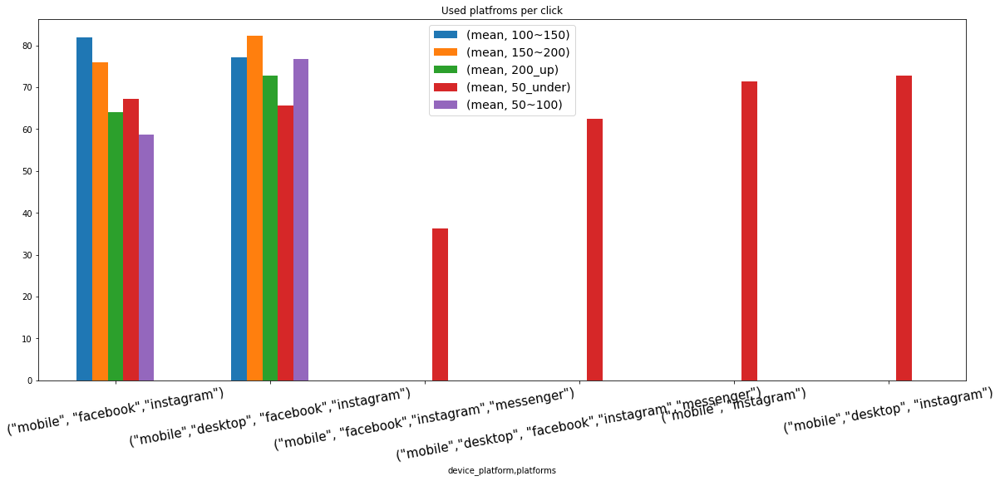

In [31]:
# mobile보다는 desktop-mobile에 많은 클릭이 발생 

df.pivot_table(index=['device_platform','platforms'],
                columns = 'ad_durings', values='cvr',
                aggfunc=['mean']).fillna(0).sort_values(by='platforms', ascending=True).plot(kind='bar', figsize=(20, 8))
plt.xticks(rotation=10, size=15)
plt.title('Used platfroms per click')
plt.legend(fontsize=14);

In [32]:
df.pivot_table(index=['device_platform','platforms'],
                columns = 'ad_durings', values='cvr',
                aggfunc=['mean']).fillna(0).sort_values(by='platforms', ascending=True)

mean              \
ad_durings                                                100~150     150~200   
device_platform    platforms                                                    
"mobile"           "facebook","instagram"             81.94181818 75.89666667   
"mobile","desktop" "facebook","instagram"             77.19192308 82.21380952   
"mobile"           "facebook","instagram","messenger"         0.0         0.0   
"mobile","desktop" "facebook","instagram","messenger"         0.0         0.0   
"mobile"           "instagram"                                0.0         0.0   
"mobile","desktop" "instagram"                                0.0         0.0   

                                                                               \
ad_durings                                                 200_up    50_under   
device_platform    platforms                                                    
"mobile"           "facebook","instagram"                 64.1082 67.21126239   
"mobile","desktop" "facebook","instagram"             72.76666667 65.56392195   
"mobile"           "facebook","instagram","messenger"         0.0     36.2275   
"mobile","desktop" "facebook","instagram","messenger"         0.0       62.43   
"mobile"           "instagram"                                0.0 71.44202572   
"mobile","desktop" "instagram"                                0.0 72.82461864   

                                                                   
ad_durings                                                 50~100  
device_platform    platforms                                       
"mobile"           "facebook","instagram"                58.62725  
"mobile","desktop" "facebook","instagram"             76.79342541  
"mobile"           "facebook","instagram","messenger"         0.0  
"mobile","desktop" "facebook","instagram","messenger"         0.0  
"mobile"           "instagram"                                0.0  
"mobile","desktop" "instagram"                                0.0

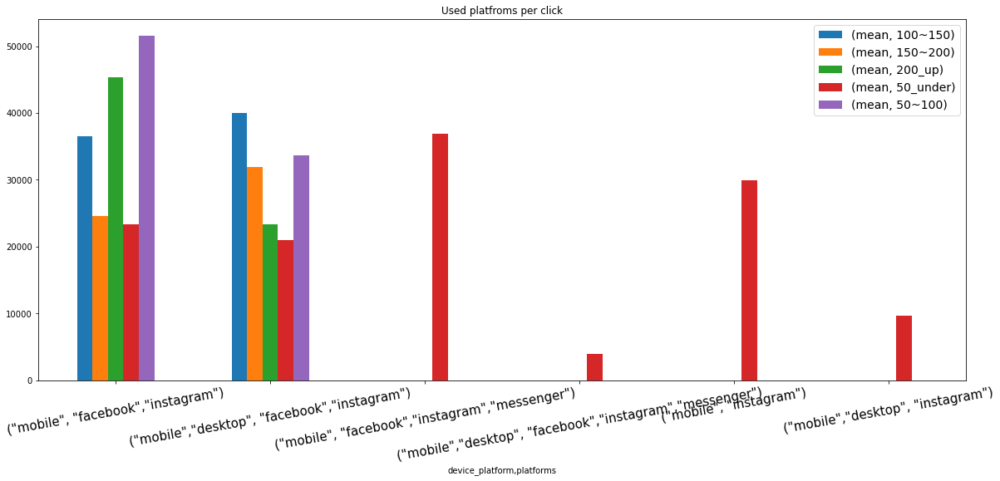

In [33]:
# 클릭별 매출을 구해 어느 기간에 많은 매출이 발생하는지 확인
# mobile과 mobile-desktop에서 많은 매출 발생

# 타겟팅인 인스타그램과 페이스북에 광고가 원활히 진행 되고있고 모바일에서는 50~100일 사이에 많은 매출이 발생하는 것으로 확인 
# 메신저로는 0~50일 사이에 많은 인기를 얻는 것으로 확인
pivot = df.pivot_table(index=['device_platform','platforms'],
                    columns = 'ad_durings', values='click_per_purchase_value',
                    aggfunc=['mean']).fillna(0).sort_values(by='platforms', ascending=True)

pivot.plot(kind='bar', figsize=(20, 8))
plt.xticks(rotation=10, size=15)
plt.title('Used platfroms per click')
plt.legend(fontsize=14);

In [34]:
df.pivot_table(index=['device_platform','platforms'],
                columns = 'ad_durings', values='click_per_purchase_value',
                aggfunc=['mean']).fillna(0).sort_values(by='platforms', ascending=True)

mean              \
ad_durings                                                100~150     150~200   
device_platform    platforms                                                    
"mobile"           "facebook","instagram"             36527.37455 24561.60333   
"mobile","desktop" "facebook","instagram"              39953.8783 31909.97952   
"mobile"           "facebook","instagram","messenger"         0.0         0.0   
"mobile","desktop" "facebook","instagram","messenger"         0.0         0.0   
"mobile"           "instagram"                                0.0         0.0   
"mobile","desktop" "instagram"                                0.0         0.0   

                                                                               \
ad_durings                                                 200_up    50_under   
device_platform    platforms                                                    
"mobile"           "facebook","instagram"              45401.1468 23391.30135   
"mobile","desktop" "facebook","instagram"             23366.05667 20940.29591   
"mobile"           "facebook","instagram","messenger"         0.0  36940.0525   
"mobile","desktop" "facebook","instagram","messenger"         0.0 3876.547778   
"mobile"           "instagram"                                0.0 29883.26481   
"mobile","desktop" "instagram"                                0.0 9642.707331   

                                                                   
ad_durings                                                 50~100  
device_platform    platforms                                       
"mobile"           "facebook","instagram"             51496.24475  
"mobile","desktop" "facebook","instagram"             33656.73193  
"mobile"           "facebook","instagram","messenger"         0.0  
"mobile","desktop" "facebook","instagram","messenger"         0.0  
"mobile"           "instagram"                                0.0  
"mobile","desktop" "instagram"                                0.0

# 전환율이 가장 높은 광고기간 확인

- quantile을 활용해서 95분위보다 작고 0보다 큰 , 즉, [0<cvr<상위 5%] 값들을 쿼리로 확인    
    - 이유 -> 클릭 숫자가 10이하에 많이 시청할 수록 큰 숫자가 나오기에 중간 값으로 설정 후 확인     


- 전환율이 높은 광고기간은 50일 밑이 가장 많은 결과가 나옵니다.   

In [35]:
print(df['cvr'].quantile(0.95))
print(df['cvr'].quantile(0.2))

93.45199999999998
50.61


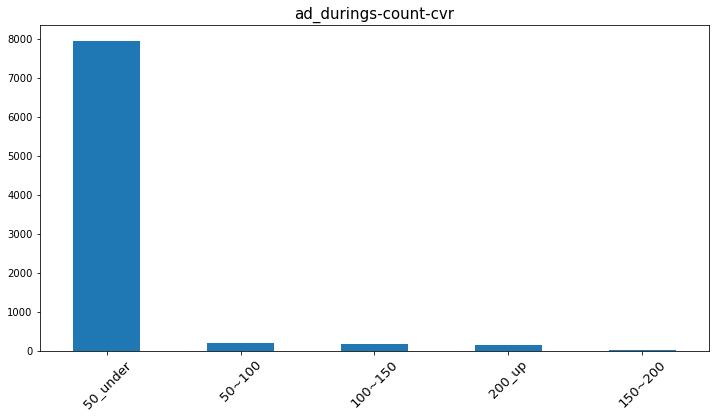

In [36]:
# 전환율이 높은 광고 기간 
df.query("(cvr > 10) and (cvr < 93)")['ad_durings'].value_counts().plot(kind='bar', figsize=(12, 6))
plt.xticks(rotation=45, fontsize=13)
plt.title('ad_durings-count-cvr', size=15);

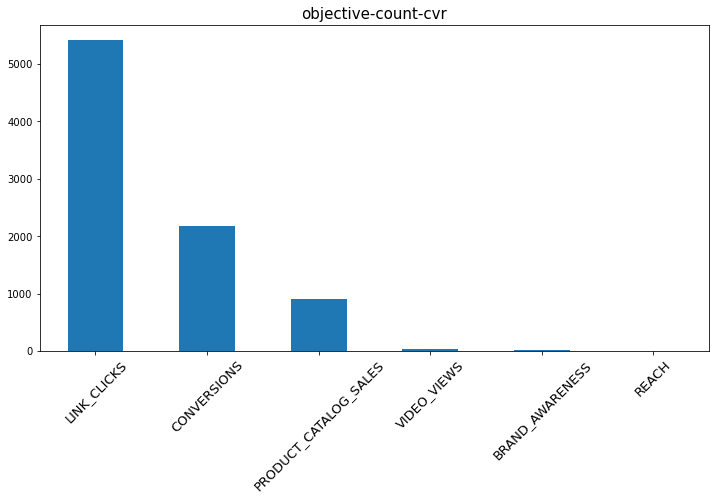

In [37]:
# 전환율이 높은 광고목표 설정 목록
df.query("(cvr > 10) and (cvr < 93)")['objective'].value_counts().plot(kind='bar', figsize=(12, 6))
plt.xticks(rotation=45, fontsize=13)
plt.title('objective-count-cvr', size=15);

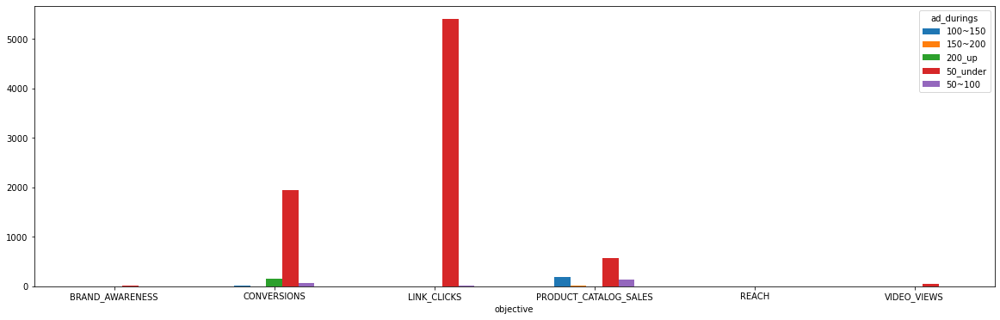

In [40]:
# 전환율이 높은 광고 목표 및 광고기간

# 광고목표인 link click은 광고 기간이 짧을 수록 전환율이 높습니다.
# 광고 목표가 제품카탈로그 판매 일 경우에는 50~150일 사이에 많은 매출이 발생한다라 보여집니다. 
df.query("(cvr > 0) and (cvr < 93)").pivot_table(index='objective', columns='ad_durings', values='adset_id', aggfunc='count').plot(kind='bar', figsize=(20, 6))
plt.xticks(rotation=0);

## 요일별 클릭 수 및 판매 수 , 매출액 시각화
- 많은 매출을 달성한 요일이 있는지 
- 클릭 수 시각화

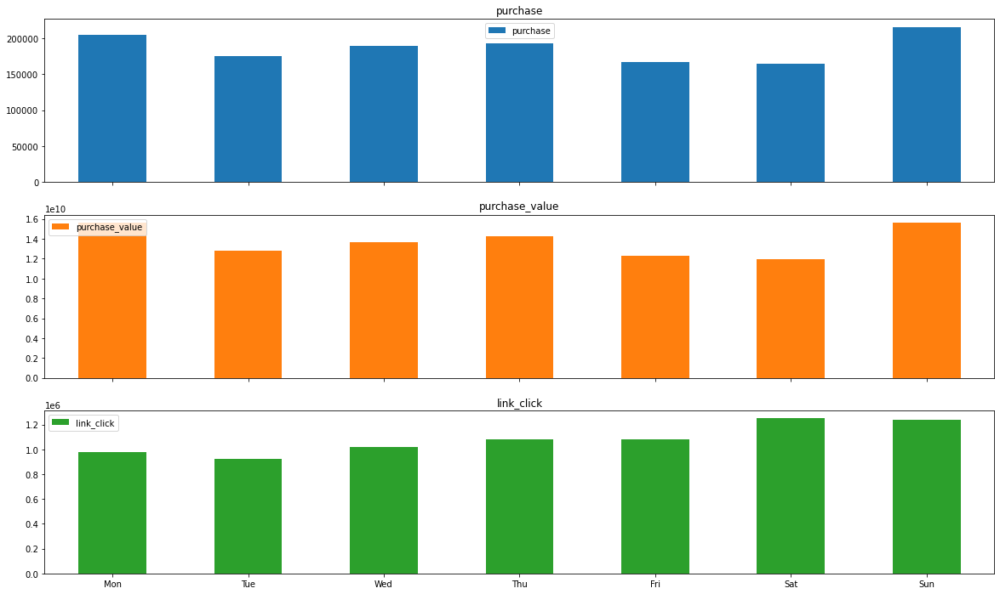

In [69]:
# 토요일과 일요일에 많은 클릭이 발생하는 것으로 확인
# 클릭은 많지는 않지만 많은 매출이 발생하는 월요일 인 것으로 확인 
day_of_week = df.set_index('date').groupby(lambda x: x.dayofweek).sum()[['purchase','purchase_value', 'link_click']]
day_of_week_list = np.array(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
day_of_week.index = day_of_week_list[day_of_week.index]


axes = day_of_week.plot.bar(rot=0, subplots=True, figsize=(20, 12))
axes[1].legend(loc=2);

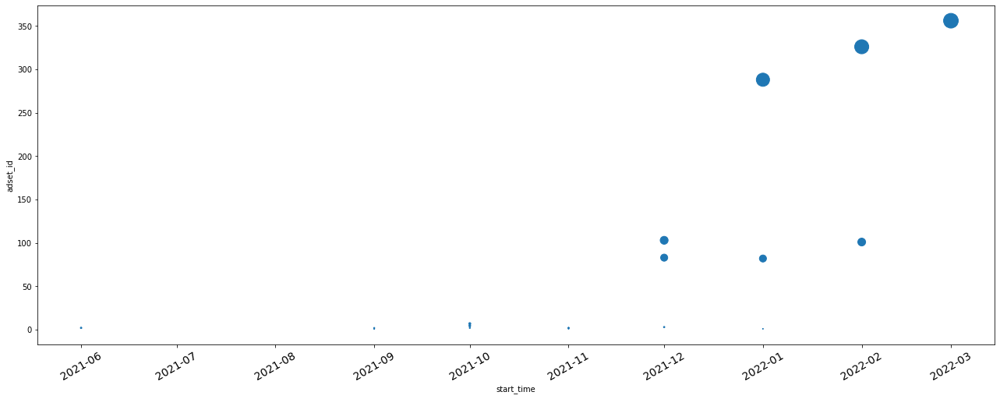

In [71]:
# 많은 광고 중 시작날짜 scatter.plot으로 시각화
# 본격적으로 12월부터 많은 광고 실행한 것으로 확인

def get_month(date):
    return datetime(date.year, date.month, 1)

def ad_count(df):
    return len(np.unique(df))

df['month_passed'] = ((df['date'].dt.year - df['ad_start_time'].dt.year) * 12 +(df['date'].dt.month -  df['ad_start_time'].dt.month)  )

df['start_time'] = df['ad_start_time'].apply(get_month)

group = df.groupby(['start_time', 'month_passed'])['adset_id'].apply(ad_count).reset_index()

group.plot.scatter(x='start_time', y = 'adset_id', figsize=(22, 8), s='adset_id')

plt.xticks(rotation=30, size=14);

In [43]:
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
#!pip install xgboost
from catboost import CatBoostRegressor
#!pip install catboost
from scipy.stats import randint 
import pickle 
import seaborn as sns
#!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

In [73]:
# RandomizedSearch_cv

# xgb_model = XGBRegressor()

# param = {
#     'n_estimators' : [100, 500, 1000, 1500, 2000, 10000],
#     'learning_rate' : [0.5 ,0.1, 0.01, 0.05, 0.001],
#     'max_depth' : randint(1, 20)
# }

# random = RandomizedSearchCV(estimator = xgb_model,
#                            param_distributions = param,
#                            scoring='neg_mean_squared_error',
#                            cv = 5, 
#                            n_iter = 10, 
#                            n_jobs=-1).fit(x_train, y_train)

/Users/chiyeong/miniforge3/envs/tf/lib/python3.8/site-packages/sklearn/base.py:324: UserWarning: Trying to unpickle estimator RandomizedSearchCV from version 1.0.2 when using version 1.0.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(


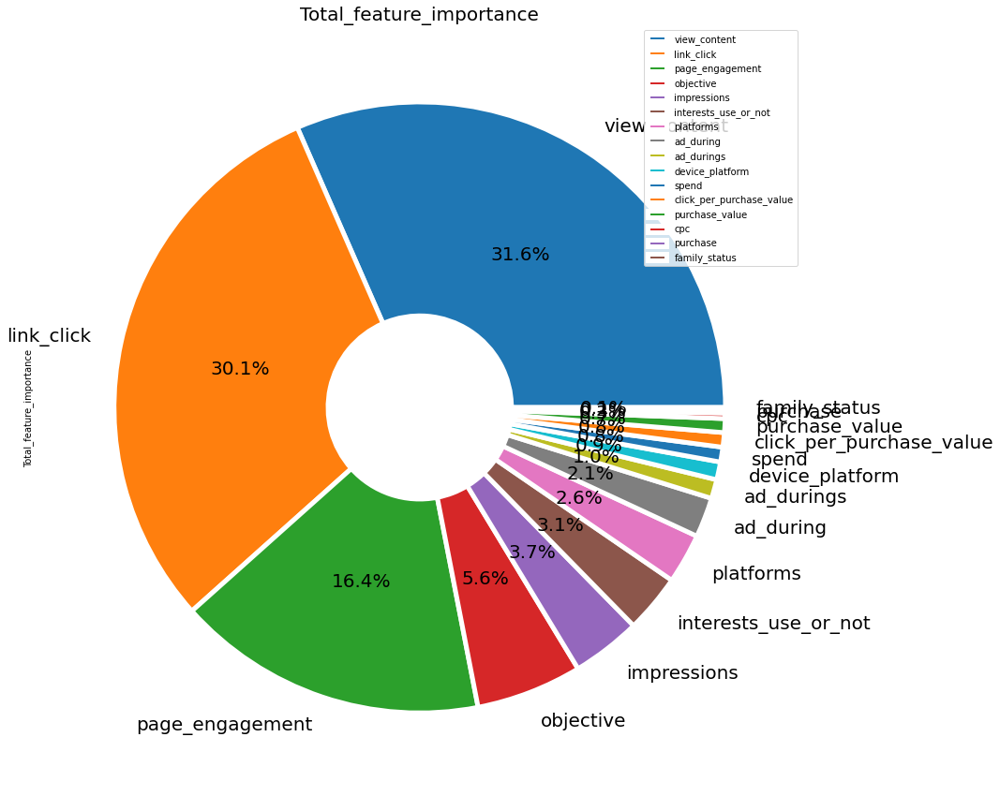

In [44]:
class model_process:
    def __init__(self, df, num=False, show_plot=False):
        
        self.df = df
        self.show_plot = show_plot
        self.num = num
        
        self.train_data,self.train_target = self.data_split(self.df)
        
        self.features, self.result = self.predict_data(self.train_data, self.train_target, self.num,self.show_plot)
        #self.features -> Total_feature_importance
        #self.result -> predict, target 
        
    def data_split(self, df):
        # 사용할 feature select
        df = df.query("(cvr > 20) and (cvr < 93)") 
        data = df[['objective', 'family_status', 'spend', 
            'impressions','link_click','page_engagement','view_content',
            'purchase','click_per_purchase_value','purchase_value','ad_during','ad_durings',
            'interests_use_or_not','device_platform','platforms','cpc']]
        
        # target = 전환율
        target = df['cvr']

        num_pipeline = Pipeline([('std_scaler', StandardScaler())])
        num_attribs = list(data.drop(columns={'objective','device_platform', 'platforms', 'family_status', 'interests_use_or_not', 'ad_durings'}))
        cat_attribs = ['objective', 'device_platform', 'platforms', 'family_status' ,'interests_use_or_not', 'ad_durings']

        # ColumnTransformer는 각 열마다 다른 변환기를 사용할 수 있도록 해주는 클래스
        # 수치형 범주형을 따로따로 적용해주는 작업
        full_pipeline = ColumnTransformer([
                ("num", num_pipeline, num_attribs), # 수치형데이터
                ("cat", OrdinalEncoder(), cat_attribs)]) # 범주형 데이터

        prepared = full_pipeline.fit_transform(data)

        #따로 만든 리스트 형태를 합쳐서 scaled_data columns로 만들어주기
        new_columns = num_attribs + cat_attribs 
        scaled_data = pd.DataFrame(prepared, columns=new_columns)

         # OrdinalEncoder로 하게되면 float이 되기에 int로 변경
        scaled_data[cat_attribs] = scaled_data[cat_attribs].astype(int)
        
        return scaled_data, target
    
    def predict_data(self, df, target, num ,show_plot):
 
        x_train, x_test, y_train, y_test = train_test_split(df, target, test_size=.2, shuffle=True, random_state=42) 
    
        # randomsearchCV로 hyper-parameter 적용한 모델 불러오기
        with open('xgboost_model.pkl', 'rb') as f: 
            model = pickle.load(f)

        
        model.best_estimator_.fit(x_train, y_train)
        predict = model.predict(x_test)
   
        #print('xgboost_r2_score : ', r2_score(target, predict_random))
        # 새로운 데이터 프레임일 들어올 경우 및 하이퍼파라미터 수정할때 주석제거

        feature_importance = {'feature_importance_col' : x_test.columns, 'feature_importance_value' : model.best_estimator_.feature_importances_}
        feature = pd.DataFrame(feature_importance).sort_values(ascending=False, by='feature_importance_value')
        feature = feature.set_index('feature_importance_col')
        feature['Total_feature_importance'] = 0
            
        # predict한 값들을 dictionary로 만들어 data frame으로 변경
        result_dict = {}
        for idx, value in enumerate(predict):
            result_dict[idx] = [value]
        
        result = pd.DataFrame(result_dict).T.rename(columns={0 : 'result'})
        # train_test_split을 진행해서 reset_index를 하지않으면 NaN 값으로 출력 
        result['target'] = y_test.reset_index(drop=True)
        
        #x_test 각각 feature_importance 들을 전부 합치기
        for i in range(len(result)):
            feature['Total_feature_importance'] += (feature['feature_importance_value'].values / result.iloc[i][0] * 100)
        
                #feature[f'feature_importance{i}'] = (feature['feature_importance_value'].values / result.iloc[i][0]) * 100
                #시간이 너무 오래걸려 전부 합쳐서 적용
        if num:
            # num을 주게 되면 해당 iloc으로 데이터의 비율 계산하기
            feature[f'feature_importance_{num}'] = (feature['feature_importance_value'].values / result.iloc[num][0] * 100) / (feature['feature_importance_value'].values / result.iloc[num][0] * 100).sum()
        
        feature['Total_feature_importance'] = feature['Total_feature_importance'] / sum(feature['Total_feature_importance'])
        
        if show_plot:
            wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5}
            if num:
                feature[f'feature_importance_{num}'].plot.pie(figsize=(20, 15), fontsize=20, autopct='%.1f%%', wedgeprops=wedgeprops)
            else:
                feature[f'Total_feature_importance'].plot.pie(figsize=(20, 15), fontsize=20, autopct='%.1f%%', wedgeprops=wedgeprops)
            plt.xticks(size=20)
            plt.yticks(size=20);
            plt.title('Total_feature_importance', size=20)
            plt.legend(loc="upper right")

    # prettytable을 활용해서 값들을 표 그래프로 시각화
    #     table = prettytable.PrettyTable(["feature_importance_col", "feature_importance_value"])
    #     for i, values in zip(feature.iloc[:3].index.tolist(), feature.iloc[:3]['feature_importance_value'].values.tolist()):
    #         table.add_row([i, round(values, 2)])
    #     print(table)
        return feature, result
    
df_ = df.copy()   
model = model_process(df_,num=False,show_plot=True)

In [45]:
model.result

,result,target
0,73.09644318,71.83
1,83.31809235,82.93
2,74.9647522,74.25
3,41.70542526,42.33
4,58.38072586,58.46
...,...,...
1690,32.96543503,31.65
1691,65.00984955,63.78
1692,80.02489471,79.84
1693,83.58006287,84.7


In [209]:
print('예측한 값이 타겟값들을 얼마나 잘 표현했는가 : ',r2_score(model.result.result, model.result.target))

예측한 값이 타겟값들을 얼마나 잘 표현했는가 :  0.9874732432033934


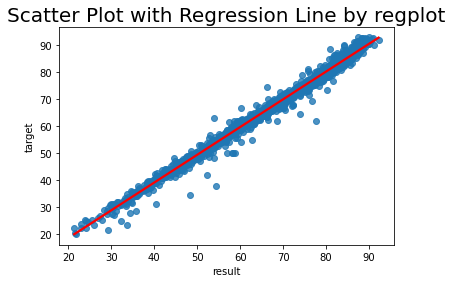

In [210]:
# 정답과 예측값을 선형으로 나타내 같은 방향으로 예측을 하고있는지에 대한 시각화 
sns.regplot(x=model.result.result, y=model.result.target, fit_reg=True,  truncate = True, line_kws = {'color': 'red'})
plt.title('Scatter Plot with Regression Line by regplot', fontsize=20)
plt.show()

In [116]:
#permutation-importance를 하는 이유는 영향력이 높은 feature들을 하나씩 빼면서 영향력을 체크하기 위함
# feature importance와 eli5 permutation importance 의 Top3는 같아 영향력을 주는 feature는 신뢰성이 있다 말할 수 있습니다.
import eli5
from eli5.sklearn import PermutationImportance

data = df[['objective', 'family_status', 'spend', 
    'impressions','link_click','page_engagement','view_content',
    'purchase','click_per_purchase_value','purchase_value','ad_during',
    'interests_use_or_not','device_platform','platforms','cpc']]

# target = 전환율
target = df['cvr']

num_pipeline = Pipeline([('std_scaler', StandardScaler())])
num_attribs = list(data.drop(columns={'objective','device_platform', 'platforms', 'family_status', 'interests_use_or_not', 'ad_during'}))
cat_attribs = ['objective', 'device_platform', 'platforms', 'family_status' ,'interests_use_or_not', 'ad_during']

# ColumnTransformer는 각 열마다 다른 변환기를 사용할 수 있도록 해주는 클래스
# 수치형 범주형을 따로따로 적용해주는 작업
full_pipeline = ColumnTransformer([
        ("num", num_pipeline, num_attribs), # 수치형데이터
        ("cat", OrdinalEncoder(), cat_attribs)]) # 범주형 데이터

prepared = full_pipeline.fit_transform(data)

#따로 만든 리스트 형태를 합쳐서 scaled_data columns로 만들어주기
new_columns = num_attribs + cat_attribs 
scaled_data = pd.DataFrame(prepared, columns=new_columns)

 # OrdinalEncoder로 하게되면 float이 되기에 int로 변경
scaled_data[cat_attribs] = scaled_data[cat_attribs].astype(int)

x_train, x_test, y_train, y_test = train_test_split(scaled_data, target, test_size=.2, shuffle=True, random_state=42) 
    
# randomsearchCV로 hyper-parameter 적용한 모델 불러오기
with open('xgboost_model.pkl', 'rb') as f: 
    model = pickle.load(f)

model = model.best_estimator_.fit(x_train, y_train)

perm = PermutationImportance(model, random_state = 42).fit(x_test, y_test)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
8.7173 ± 0.2023,view_content
5.0919 ± 0.1641,link_click
0.2982 ± 0.0099,page_engagement
0.0493 ± 0.0161,impressions
0.0326 ± 0.0036,spend
0.0094 ± 0.0025,cpc
0.0048 ± 0.0042,click_per_purchase_value
0.0044 ± 0.0008,platforms
0.0025 ± 0.0054,purchase_value
0.0017 ± 0.0014,purchase


You should provide test set for use best model. use_best_model parameter has been switched to false value.


Learning rate set to 0.008614
0:	learn: 19.1316978	total: 15.5ms	remaining: 2m 34s
1000:	learn: 7.3061483	total: 1.64s	remaining: 14.8s
2000:	learn: 4.2987099	total: 3.14s	remaining: 12.6s
3000:	learn: 2.9177786	total: 4.62s	remaining: 10.8s
4000:	learn: 2.1915333	total: 6.08s	remaining: 9.12s
5000:	learn: 1.7471962	total: 7.56s	remaining: 7.55s
6000:	learn: 1.4600557	total: 9.08s	remaining: 6.05s
7000:	learn: 1.2667351	total: 10.6s	remaining: 4.53s
8000:	learn: 1.1220476	total: 12s	remaining: 3.01s
9000:	learn: 1.0099801	total: 13.5s	remaining: 1.49s
9999:	learn: 0.9210961	total: 14.9s	remaining: 0us
catboost_r2_score :  0.906357868266506


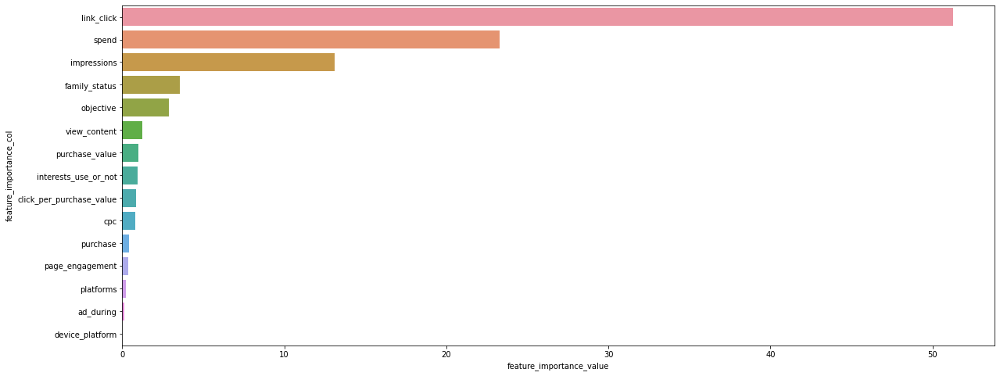

In [68]:
# catboost 진행
# catboost 같은 경우는 하이퍼 파라미터 수정에 민감하지는 않지만
# xgboost는 하이퍼 파라미터에 민감해서 randomizedsearchcv 적용해봤습니다.
# catboost는 하이퍼 파라미터를 넣지않는게 더 좋은 성능을 출력하고 xgboost는 하이퍼파라미터를 수정해야 좋은 결과를 도출합니다.

cb_model = CatBoostRegressor(random_state=42, iterations=10000).fit(x_train,y_train,early_stopping_rounds=10, verbose=0,use_best_model=True)
predict = cb_model.predict(x_test)
print('catboost_r2_score : ',r2_score(y_test, predict))

feature_importance = {'feature_importance_col' : data.columns, 'feature_importance_value' : cb_model.feature_importances_}
feature = pd.DataFrame(feature_importance).sort_values(ascending=False, by='feature_importance_value')
plt.figure(figsize=(20, 8))
sns.barplot(x=feature['feature_importance_value'], y=feature['feature_importance_col']);

In [70]:
perm = PermutationImportance(cb_model, random_state = 42).fit(x_test, y_test)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
7.3404 ± 0.2692,view_content
2.6056 ± 0.0660,link_click
0.9052 ± 0.0112,page_engagement
0.0684 ± 0.0051,spend
0.0148 ± 0.0058,impressions
0.0116 ± 0.0116,click_per_purchase_value
0.0075 ± 0.0074,purchase
0.0060 ± 0.0052,cpc
0.0058 ± 0.0057,purchase_value
0.0011 ± 0.0004,interests_use_or_not


## 정리
### 키워드 설정 부분을 대폭 수정해가며 비교를 해야하고 
### 키워드를 설정하지않아도 전환율이나 매출이 높을 경우 키워드를 설정하게 되면 타겟팅을 하기에 더 높은 전환율과 매출을 나타내지않을까 생각합니다.
### pratform은 instagram에서 짧은 광고기간에서 높은 전환율이 나타나고 있고 device_platforms에서는 mobile도 꽤 괜찮은 전환율이 보이지만 mobile, desktop으로 진행하는 방향이 좋아보입니다.
### 광고기간이 짧은 경우에 광고 목표를 link_click으로 설정하는 게 좋고 
### 광고기간이 50~150일 경우에는 광고목표를 Product_catalog_sales를
### 광고기간이 150이상 넘어갈 경우 Conversions, device_platforms 는 mobile로만 진행을 하게 되면 전환율에 많은 영향을 끼칠 것으로 보입니다. 

In [214]:
# 광고 기간이 짧은 경우는 목표를 link_click을 사용하고 mobile 단독으로 진행하기보다는 mobiel,desktop을 사용하는게 유리
# 광고기간이 50~150일 경우에는 목표를 PRODUCT_CATALOG_SALES
# 광고기간이 150~ 일 경우 CONVERSIONS 이면 전환율이 높을 것으로 예상됩니다.
df['interests_use_or_not'] = df['interests_use_or_not'].apply(lambda x: 'YES' if x == 1 else 'No')
df.pivot_table(index=['objective', 'platforms', 'device_platform', 'interests_use_or_not'], columns=['month_passed'], values='cvr', aggfunc='mean').fillna(0)

month_passed                                                                                                0  \
objective             platforms                          device_platform    interests_use_or_not                
BRAND_AWARENESS       "facebook","instagram"             "mobile","desktop" YES                       37.7875   
CONVERSIONS           "facebook","instagram"             "mobile"           No                         65.865   
                                                                            YES                   75.58910714   
                                                         "mobile","desktop" No                    63.90155523   
                                                                            YES                   62.28589077   
                      "instagram"                        "mobile","desktop" No                       75.30375   
LINK_CLICKS           "facebook","instagram"             "mobile"           No                    64.95408451   
                                                                            YES                   65.77956606   
                                                         "mobile","desktop" No                    64.51922956   
                                                                            YES                   64.04666991   
                      "facebook","instagram","messenger" "mobile"           No                        36.2275   
                                                         "mobile","desktop" YES                         62.43   
                      "instagram"                        "mobile"           No                      63.777875   
                                                                            YES                   74.34958932   
                                                         "mobile","desktop" No                    72.22777778   
                                                                            YES                   78.14462687   
PRODUCT_CATALOG_SALES "facebook","instagram"             "mobile"           No                    74.87522727   
                                                         "mobile","desktop" No                    67.82836158   
                                                                            YES                   59.26808081   
REACH                 "instagram"                        "mobile"           YES                         47.43   
VIDEO_VIEWS           "facebook","instagram"             "mobile","desktop" No                          0.705   
                                                                            YES                  0.5569565217   
                      "instagram"                        "mobile"           No                           79.0   
                                                                            YES                   54.25242424   
                                                         "mobile","desktop" YES                      33.55875   

month_passed                                                                                               1  \
objective             platforms                          device_platform    interests_use_or_not               
BRAND_AWARENESS       "facebook","instagram"             "mobile","desktop" YES                  42.79142857   
CONVERSIONS           "facebook","instagram"             "mobile"           No                         63.73   
                                                                            YES                          0.0   
                                                         "mobile","desktop" No                   67.47871951   
                                                                            YES                   73.3215748   
                      "instagram"                        "mobile","desktop" No                           0.0   
LINK_CLICKS           "facebook","instagram"        